# Explainability of DenseNet-121 on RSNA

**Overview:**

In this notebook, we evaluate the interpretability of DenseNet-121 on a subset of the RSNA Pneumonia Chest X-ray dataset. We use multiple explanation methods including Grad-CAM, Grad-CAM++ and Integrated Gradients.

**Architecture choices:**

DenseNet-121 was selected for experiments on the reduced dataset due to its efficient feature reuse through dense connections, which provides a better generalization even with limited data. These properties make it a popular choice for medical imaging applications in general.

In [ ]:
!pip install torch torchvision tqdm grad-cam captum

**Model Setup and Fine-Tuning:**

A subset (~600 images) of the RSNA Chest X-Ray dataset was used for evaluation. The images were resized to 244x244 to match the model's input requirements. The model was inititalized with pre-defined weights, and was fine tuned for 5 epochs to achieve an accuracy of 90%.

/Users/sathammai/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/sathammai/Library/Python/3.9/lib/python/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Full subset metrics:
Accuracy: 0.9073
Precision: 0.9202
Recall: 0.9295
F1 Score: 0.9248
AUROC: 0.9485


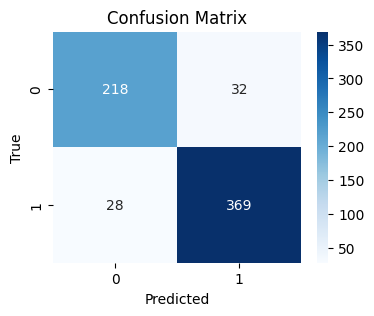

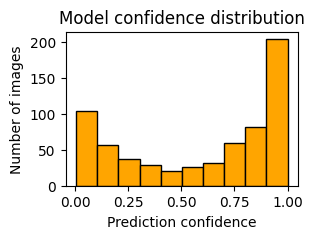

In [1]:
import os
import pandas as pd
import torch
import torch.nn.functional as F
from torchvision import models, transforms
from PIL import Image
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Paths ----------
IMAGE_DIR = '/Users/sathammai/Downloads/RSNA_subset1/images'
CSV_PATH = '/Users/sathammai/Downloads/RSNA_subset1/labels_subset.csv'
MODEL_PATH = '/Users/sathammai/Downloads/RSNA_subset1/best_densenet121_rsna.pth'

# ---------- Device ----------
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
IMG_SIZE = 224

# ---------- Load CSV ----------
df = pd.read_csv(CSV_PATH)

# ---------- Transform ----------
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])

# ---------- Load model (exact same setup as training) ----------
model = models.densenet121(pretrained=True)
num_ftrs = model.classifier.in_features
model.classifier = torch.nn.Linear(num_ftrs, 1)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model = model.to(DEVICE)
model.eval()

# ---------- Evaluation ----------
all_labels, all_preds, all_confs = [], [], []

with torch.no_grad():
    for _, row in df.iterrows():
        patient_id = row['patientId']
        label = int(row['Target'])

        img_path = os.path.join(IMAGE_DIR, f"{patient_id}.png")
        img = Image.open(img_path).convert('RGB')
        img_tensor = transform(img).unsqueeze(0).to(DEVICE)

        output = model(img_tensor)
        probs = torch.sigmoid(output)
        pred = (probs > 0.5).long()

        all_labels.append(label)
        all_preds.append(pred.item())
        all_confs.append(probs.item())

# ---------- Metrics ----------
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, zero_division=0)
recall = recall_score(all_labels, all_preds, zero_division=0)
f1 = f1_score(all_labels, all_preds, zero_division=0)
try:
    auroc = roc_auc_score(all_labels, all_confs)
except ValueError:
    auroc = float('nan')

print("Full subset metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"AUROC: {auroc:.4f}")

# ---------- Confusion matrix ----------
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(4,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# ---------- Confidence histogram ----------
plt.figure(figsize=(3,2))
plt.hist(all_confs, bins=10, color="orange", edgecolor="k")
plt.xlabel("Prediction confidence")
plt.ylabel("Number of images")
plt.title("Model confidence distribution")
plt.show()


## Grad-CAM: Visualizing model attention

**Concept**:

Grad-CAM highlights the image regions that are most responsible for the model's decision by tracing class-specific gradients throught the final feature maps.

**Purpose**:

In our notebook, we use it to interpret spatial focus in the final 3×3 convolutional layer in the last dense block (`model.features.denseblock4.denselayer16.conv2`) of DenseNet-121. This is the deepest feature extraction layer before global average pooling and classification.


**Quick references**
- Selvaraju et al., *Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization* (2017).  
- `pytorch-grad-cam` (Jacob Gildenblat) — used for production-ready Grad-CAM utilities.



## Grad-CAM++: Visualizing model attention

**Concept**:

Grad-CAM++ refines Grad-CAM by incorporating higher-order gradient information. This enhances localization and handling of multiple object instances.

**Purpose**:

Used to asses how finely the model distinguishes multiple features or parts within an image.

**Quick references**

Chattopadhyay et al., Grad-CAM++: Improved Visual Explanations for Deep Convolutional Networks, WACV 2018.  

Gildenblat, pytorch-grad-cam library — robust reference implementation.

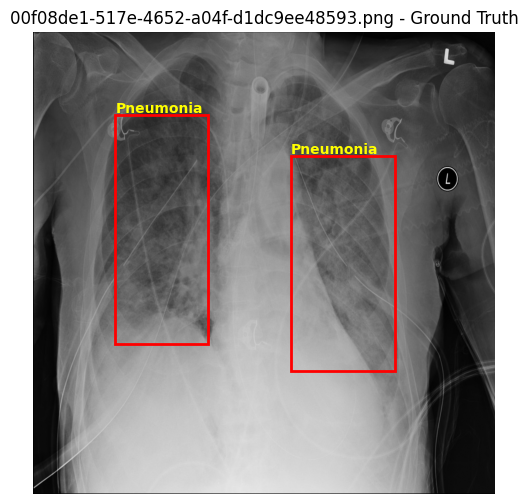

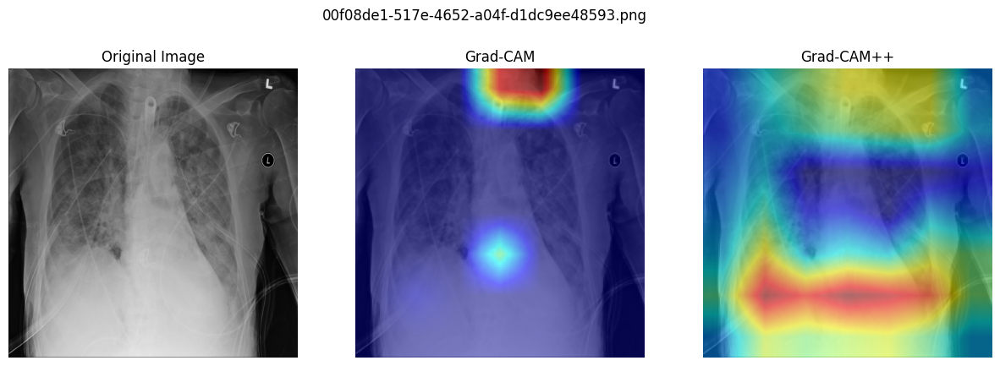

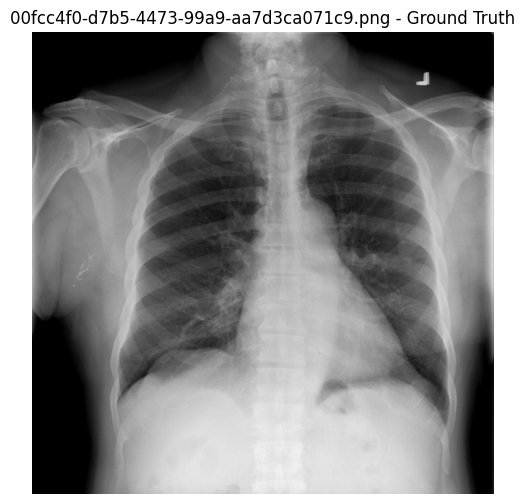

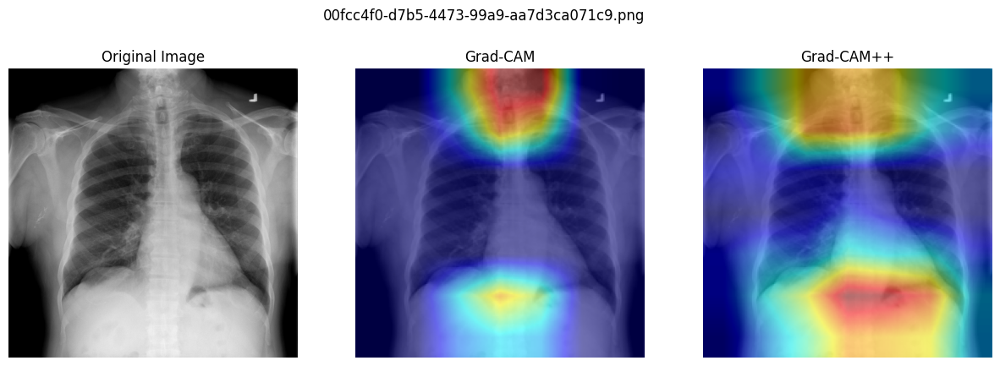

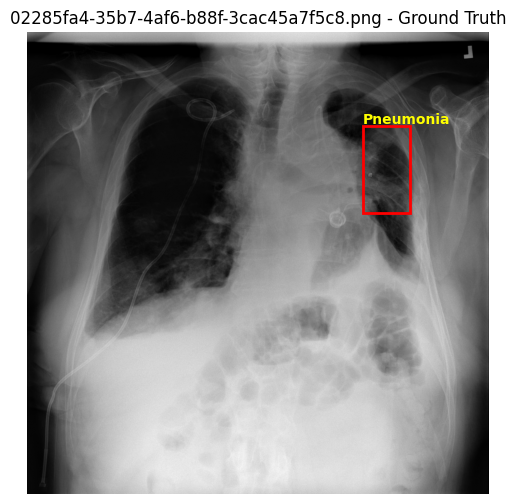

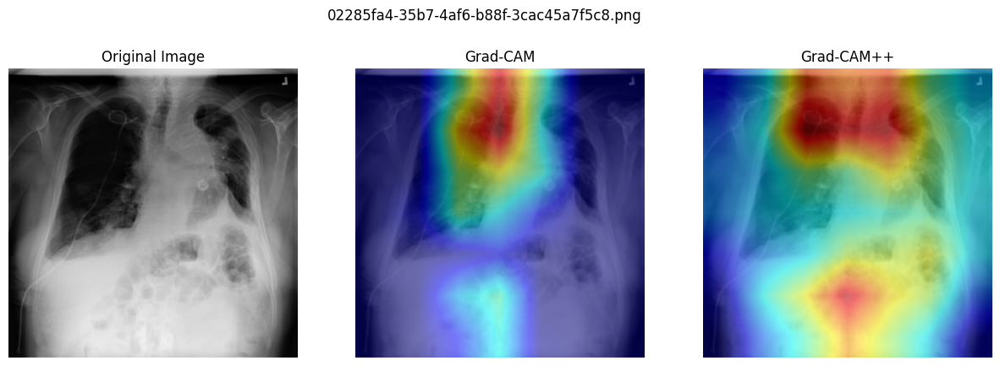

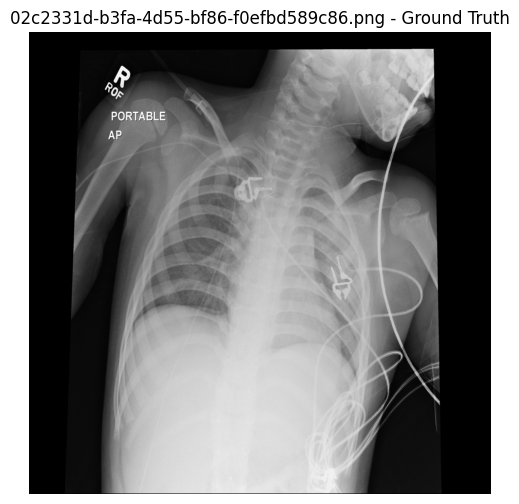

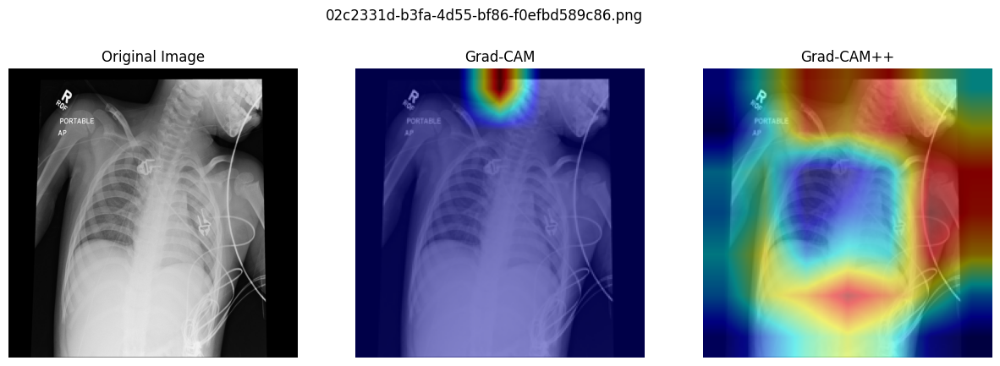

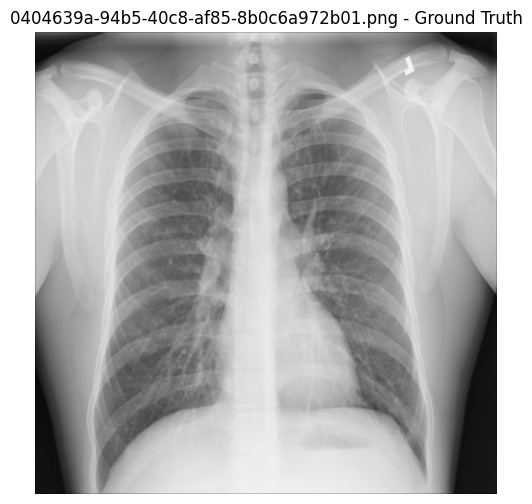

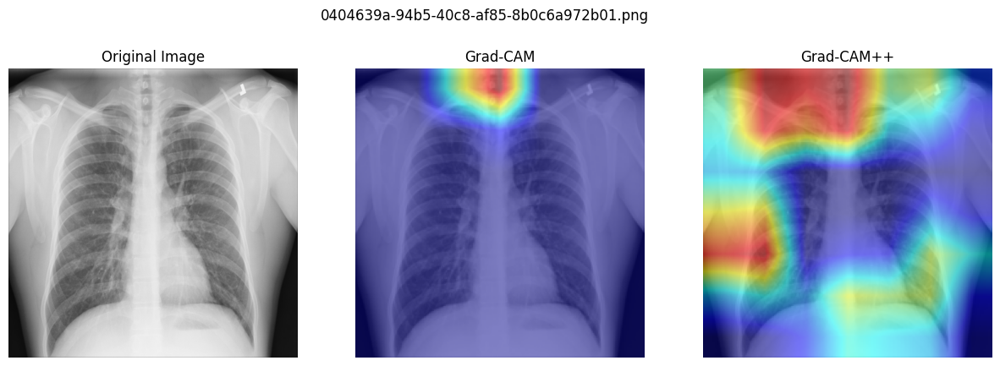

In [ ]:
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# ------------------ CONFIG ------------------
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
IMAGE_DIR = '/Users/sathammai/Downloads/RSNA_subset1/images'
CSV_PATH = '/Users/sathammai/Downloads/RSNA_subset1/labels_subset.csv'
IMG_SIZE = 224
NUM_IMAGES = 5
# --------------------------------------------

# ---------- DATASET ----------
class RSNADataset(Dataset):
    def __init__(self, image_dir, csv_path, transform=None):
        self.image_dir = image_dir
        self.df = pd.read_csv(csv_path)
        self.filenames = sorted(os.listdir(image_dir))[:NUM_IMAGES]  # limit to 20
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        img_path = os.path.join(self.image_dir, fname)
        img = Image.open(img_path).convert("RGB")

        if self.transform:
            img_tensor = self.transform(img)
        else:
            img_tensor = transforms.ToTensor()(img)

        pid = os.path.splitext(fname)[0]
        label = int((self.df[self.df['patientId'] == pid]['Target'].sum()) > 0)

        return img, img_tensor, label, fname  # return both PIL and tensor

# ---------- TRANSFORMS FOR MODEL ----------
model_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = RSNADataset(IMAGE_DIR, CSV_PATH)
loader = DataLoader(dataset, batch_size=1, shuffle=False)

# ---------- LOAD MODEL ----------
# Assume `model` is DenseNet-121, fine-tuned
model.to(DEVICE)
model.eval()

# ---------- GRADCAM SETUP ----------
target_layer = model.features.denseblock4.denselayer16.conv2
gradcam = GradCAM(model=model, target_layers=[target_layer])
gradcam_pp = GradCAMPlusPlus(model=model, target_layers=[target_layer])

# ---------- READ CSV FOR BOUNDING BOXES ----------
df = pd.read_csv(CSV_PATH)

# ---------- LOOP WITHOUT DATALOADER ----------
for i in range(len(dataset)):
    pil_img, img_tensor, label, fname = dataset[i]  # get individual sample

    # --- Original image ---
    orig_np = np.array(pil_img) / 255.0

    # --- Ground truth boxes ---
    pid = os.path.splitext(fname)[0]
    boxes = df[df['patientId'] == pid]

    gt_fig, gt_ax = plt.subplots(1, figsize=(6,6))
    gt_ax.imshow(orig_np)

    if not boxes.empty:
        for _, row in boxes.iterrows():
            if row['Target'] == 1:
                x, y, w, h = row['x'], row['y'], row['width'], row['height']
                rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
                gt_ax.add_patch(rect)
                gt_ax.text(x, y-5, 'Pneumonia', color='yellow', fontsize=10, weight='bold')
    else:
        gt_ax.text(10, 20, 'No bounding box', color='cyan', fontsize=12, weight='bold')

    gt_ax.axis('off')
    gt_ax.set_title(f"{fname} - Ground Truth")

    # --- Prepare image for Grad-CAM ---
    normalized_tensor = model_transform(pil_img).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        output = model(normalized_tensor)
    target_idx = 0 if output.shape[-1] == 1 else 1
    target = [ClassifierOutputTarget(target_idx)]

    # --- Grad-CAM ---
    cam = gradcam(input_tensor=normalized_tensor, targets=target)
    cam_image = show_cam_on_image(np.array(pil_img.resize((IMG_SIZE, IMG_SIZE)))/255.0, cam[0], use_rgb=True)

    # --- Grad-CAM++ ---
    cam_pp = gradcam_pp(input_tensor=normalized_tensor, targets=target)
    cam_pp_image = show_cam_on_image(np.array(pil_img.resize((IMG_SIZE, IMG_SIZE)))/255.0, cam_pp[0], use_rgb=True)

    # --- Plot all together ---
    fig, axes = plt.subplots(1,3, figsize=(15,5))
    axes[0].imshow(orig_np)
    axes[0].set_title('Original Image')
    axes[1].imshow(cam_image)
    axes[1].set_title('Grad-CAM')
    axes[2].imshow(cam_pp_image)
    axes[2].set_title('Grad-CAM++')
    for ax in axes:
        ax.axis('off')
    plt.suptitle(fname)
    plt.show()



**Observation**:

Grad-CAM heatmaps primarily highlight the neck region while Grad-CAM++ highlights the neck and the diaphragm region. This occurs due to the positional and acquistion biases in the RSNA dataset. As a result, the model relies on spurious features instead of true pathalogical evidence (the regions enclosed by the ground-truth box). 

## Insertion & Deletion Curves

**Concept**:

Insertion measures how the model's confidence rises as the important pixels are added back. Deletion measures how the model's confidence falls as those pixels are removed.

**Purpose**:

Used to evaluate the **faithfulness** of the explanations i.e. whether the highlighted regions truly influence the model's predictions or not.


## Entropy & Sparsity
**Concept**:

Entropy measures how spread-out the attention is on a saliency map, while Sparsity quantifies how concentrated it is (i.e. how much of the total area actually carries **meaningful activation**)

For highly focused attributions, the Entropy should be lower while the Sparsity should be higher.


**Purpose**:

Used to quantify how focused or diffused the model's visual explanations are.


Grad-CAM Insertion/Deletion: 100%|██████████| 5/5 [05:00<00:00, 60.09s/it]


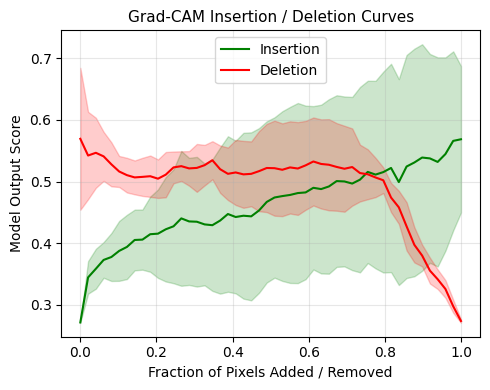

Insertion AUC : 0.4623 ± 0.1149
Deletion  AUC : 0.4933 ± 0.0289
Heatmap Entropy  : 13.3183 ± 0.0678
Heatmap Sparsity : 0.5094 ± 0.0426


In [21]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from tqdm import tqdm
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# ---------- Helper Functions ----------
def apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="insertion", steps=50):
    _, C, H, W = img_tensor.shape
    flat_idx = np.argsort(heatmap.ravel())  # low → high importance

    if mode == "insertion":
        masked_img = torch.zeros_like(img_tensor)
        indices_order = flat_idx[::-1]
    elif mode == "deletion":
        masked_img = img_tensor.clone()
        indices_order = flat_idx[::-1]
    else:
        raise ValueError("mode must be 'insertion' or 'deletion'")

    scores = []
    total_pixels = H * W
    step_size = max(total_pixels // steps, 1)

    for i in range(0, total_pixels, step_size):
        idx = indices_order[:i]
        ys, xs = idx // W, idx % W

        if mode == "insertion":
            masked_img[:, :, ys, xs] = img_tensor[:, :, ys, xs]
        else:  # deletion
            masked_img[:, :, ys, xs] = 0

        with torch.no_grad():
            out = model(masked_img.to(DEVICE))
            if out.shape[-1] > 1:
                score = torch.softmax(out, dim=1)[0, pred].item()
            else:
                score = torch.sigmoid(out)[0].item()
        scores.append(score)

    scores = np.interp(np.linspace(0, 1, steps),
                       np.linspace(0, 1, len(scores)), scores)
    return scores


def heatmap_entropy(heatmap):
    """Entropy: how spread-out the Grad-CAM is"""
    p = heatmap.flatten()
    p = p / (p.sum() + 1e-8)
    return -np.sum(p * np.log(p + 1e-8))


def heatmap_sparsity(heatmap):
    """Sparsity: how concentrated the Grad-CAM is"""
    h = heatmap.flatten()
    N = len(h)
    return 1 - ((np.sum(np.abs(h)))**2) / (N * np.sum(h**2) + 1e-8)


# ---------- Main Evaluation ----------
insertion_curves, deletion_curves = [], []
entropy_list, sparsity_list = [], []
num_samples = 5  # number of test images

target_layer = list(model.features.children())[-1]
cam = GradCAM(model=model, target_layers=[target_layer])

for i in tqdm(range(num_samples), desc="Grad-CAM Insertion/Deletion"):
    _, img_tensor, label, fname = dataset[i]
    img_tensor = img_tensor.unsqueeze(0).to(DEVICE)

    # model prediction
    with torch.no_grad():
        out = model(img_tensor)
        prob = torch.sigmoid(out)
        pred = int(prob > 0.5)

    # ---------- Grad-CAM ----------
    grayscale_cam = cam(input_tensor=img_tensor, targets=[BinaryClassifierOutputTarget(pred)])
    heatmap = grayscale_cam[0]
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    # ---------- Curves ----------
    insertion_curve = apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="insertion")
    deletion_curve  = apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="deletion")
    insertion_curves.append(insertion_curve)
    deletion_curves.append(deletion_curve)

    # ---------- Heatmap Metrics ----------
    entropy_val = heatmap_entropy(heatmap)
    sparsity_val = heatmap_sparsity(heatmap)
    entropy_list.append(entropy_val)
    sparsity_list.append(sparsity_val)


# ---------- Aggregate & Plot ----------
steps = 50
x = np.linspace(0, 1, steps)

insertion_curves_np = np.array(insertion_curves)
deletion_curves_np  = np.array(deletion_curves)

insertion_mean, insertion_std = insertion_curves_np.mean(0), insertion_curves_np.std(0)
deletion_mean, deletion_std   = deletion_curves_np.mean(0), deletion_curves_np.std(0)

# AUCs
insertion_aucs = [auc(x, c) for c in insertion_curves_np]
deletion_aucs  = [auc(x, c) for c in deletion_curves_np]
ins_auc_mean, ins_auc_std = np.mean(insertion_aucs), np.std(insertion_aucs)
del_auc_mean, del_auc_std = np.mean(deletion_aucs), np.std(deletion_aucs)

# ---------- Plot Curves ----------
plt.figure(figsize=(5, 4))
plt.plot(x, insertion_mean, label="Insertion", color="green")
plt.fill_between(x, insertion_mean - insertion_std, insertion_mean + insertion_std, color="green", alpha=0.2)
plt.plot(x, deletion_mean, label="Deletion", color="red")
plt.fill_between(x, deletion_mean - deletion_std, deletion_mean + deletion_std, color="red", alpha=0.2)

plt.xlabel("Fraction of Pixels Added / Removed")
plt.ylabel("Model Output Score")
plt.title("Grad-CAM Insertion / Deletion Curves", fontsize=11)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ---------- Metric Summary ----------
ent_mean, ent_std = np.mean(entropy_list), np.std(entropy_list)
sparse_mean, sparse_std = np.mean(sparsity_list), np.std(sparsity_list)


print(f"Insertion AUC : {ins_auc_mean:.4f} ± {ins_auc_std:.4f}")
print(f"Deletion  AUC : {del_auc_mean:.4f} ± {del_auc_std:.4f}")
print(f"Heatmap Entropy  : {ent_mean:.4f} ± {ent_std:.4f}")
print(f"Heatmap Sparsity : {sparse_mean:.4f} ± {sparse_std:.4f}")



**Observations**:

The relatively high Entropy indicates that the attention is widely spread across the image, while the moderate Sparsity suggests that around half of the pixels were significantly activated. The intuitive Insertion and Deletion curves show modest but consistent changes in prediction confidence, implying that these highlighted pixels did affect the model's predictions. 

Grad-CAM++ Insertion/Deletion: 100%|██████████| 5/5 [04:58<00:00, 59.78s/it]


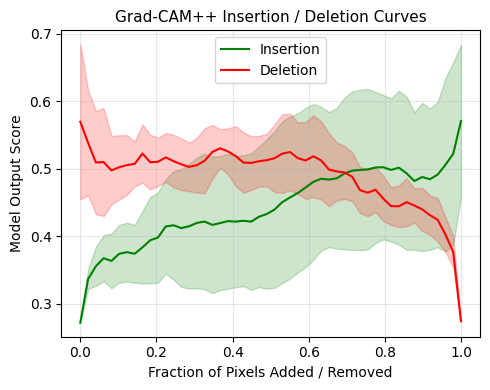

Insertion AUC : 0.4429 ± 0.0871
Deletion  AUC : 0.4907 ± 0.0266
Heatmap Entropy  : 13.7187 ± 0.0250
Heatmap Sparsity : 0.2091 ± 0.0391


In [22]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from tqdm import tqdm
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# ---------- Helper Functions ----------
def apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="insertion", steps=50):
    _, C, H, W = img_tensor.shape
    flat_idx = np.argsort(heatmap.ravel())  # low → high importance

    if mode == "insertion":
        masked_img = torch.zeros_like(img_tensor)
        indices_order = flat_idx[::-1]
    elif mode == "deletion":
        masked_img = img_tensor.clone()
        indices_order = flat_idx[::-1]
    else:
        raise ValueError("mode must be 'insertion' or 'deletion'")

    scores = []
    total_pixels = H * W
    step_size = max(total_pixels // steps, 1)

    for i in range(0, total_pixels, step_size):
        idx = indices_order[:i]
        ys, xs = idx // W, idx % W

        if mode == "insertion":
            masked_img[:, :, ys, xs] = img_tensor[:, :, ys, xs]
        else:  # deletion
            masked_img[:, :, ys, xs] = 0

        with torch.no_grad():
            out = model(masked_img.to(DEVICE))
            if out.shape[-1] > 1:
                score = torch.softmax(out, dim=1)[0, pred].item()
            else:
                score = torch.sigmoid(out)[0].item()
        scores.append(score)

    scores = np.interp(np.linspace(0, 1, steps),
                       np.linspace(0, 1, len(scores)), scores)
    return scores


def heatmap_entropy(heatmap):
    """Entropy: how spread-out the Grad-CAM++ map is"""
    p = heatmap.flatten()
    p = p / (p.sum() + 1e-8)
    return -np.sum(p * np.log(p + 1e-8))


def heatmap_sparsity(heatmap):
    """Sparsity: how concentrated the Grad-CAM++ map is"""
    h = heatmap.flatten()
    N = len(h)
    return 1 - ((np.sum(np.abs(h)))**2) / (N * np.sum(h**2) + 1e-8)


# ---------- Main Evaluation ----------
insertion_curves, deletion_curves = [], []
entropy_list, sparsity_list = [], []
num_samples = 5  # number of test images

target_layer = list(model.features.children())[-1]
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

for i in tqdm(range(num_samples), desc="Grad-CAM++ Insertion/Deletion"):
    _, img_tensor, label, fname = dataset[i]
    img_tensor = img_tensor.unsqueeze(0).to(DEVICE)

    # model prediction
    with torch.no_grad():
        out = model(img_tensor)
        prob = torch.sigmoid(out)
        pred = int(prob > 0.5)

    # ---------- Grad-CAM++ ----------
    grayscale_cam = cam(input_tensor=img_tensor, targets=[BinaryClassifierOutputTarget(pred)])
    heatmap = grayscale_cam[0]
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    # ---------- Curves ----------
    insertion_curve = apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="insertion")
    deletion_curve  = apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="deletion")
    insertion_curves.append(insertion_curve)
    deletion_curves.append(deletion_curve)

    # ---------- Heatmap Metrics ----------
    entropy_val = heatmap_entropy(heatmap)
    sparsity_val = heatmap_sparsity(heatmap)
    entropy_list.append(entropy_val)
    sparsity_list.append(sparsity_val)


# ---------- Aggregate & Plot ----------
steps = 50
x = np.linspace(0, 1, steps)

insertion_curves_np = np.array(insertion_curves)
deletion_curves_np  = np.array(deletion_curves)

insertion_mean, insertion_std = insertion_curves_np.mean(0), insertion_curves_np.std(0)
deletion_mean, deletion_std   = deletion_curves_np.mean(0), deletion_curves_np.std(0)

# AUCs
insertion_aucs = [auc(x, c) for c in insertion_curves_np]
deletion_aucs  = [auc(x, c) for c in deletion_curves_np]
ins_auc_mean, ins_auc_std = np.mean(insertion_aucs), np.std(insertion_aucs)
del_auc_mean, del_auc_std = np.mean(deletion_aucs), np.std(deletion_aucs)

# ---------- Plot Curves ----------
plt.figure(figsize=(5, 4))
plt.plot(x, insertion_mean, label="Insertion", color="green")
plt.fill_between(x, insertion_mean - insertion_std, insertion_mean + insertion_std, color="green", alpha=0.2)
plt.plot(x, deletion_mean, label="Deletion", color="red")
plt.fill_between(x, deletion_mean - deletion_std, deletion_mean + deletion_std, color="red", alpha=0.2)

plt.xlabel("Fraction of Pixels Added / Removed")
plt.ylabel("Model Output Score")
plt.title("Grad-CAM++ Insertion / Deletion Curves", fontsize=11)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ---------- Metric Summary ----------
ent_mean, ent_std = np.mean(entropy_list), np.std(entropy_list)
sparse_mean, sparse_std = np.mean(sparsity_list), np.std(sparsity_list)

print(f"Insertion AUC : {ins_auc_mean:.4f} ± {ins_auc_std:.4f}")
print(f"Deletion  AUC : {del_auc_mean:.4f} ± {del_auc_std:.4f}")
print(f"Heatmap Entropy  : {ent_mean:.4f} ± {ent_std:.4f}")
print(f"Heatmap Sparsity : {sparse_mean:.4f} ± {sparse_std:.4f}")


**Observations**:

Grad-CAM++ exhibits a similar Entropy to Grad-CAM, indicating that the heatmaps are still diffuse. However, the lower Sparsity suggests that the attention is more evenly distributed across the image, implying that the highlighted regions contribute more uniformly to the model's predictions. This is further confirmed by the gradually increasing Insertion and Deletion curves, which reflect the balanced influence these regions have on the model's confidence.

In [4]:
# ---------- DATASET ----------
class RSNADataset(Dataset):
    def __init__(self, image_dir, csv_path, transform=None):
        self.image_dir = image_dir
        self.df = pd.read_csv(csv_path)
        self.filenames = sorted(os.listdir(image_dir))[:NUM_IMAGES]  # limit to 20
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        img_path = os.path.join(self.image_dir, fname)
        img = Image.open(img_path).convert("RGB")

        if self.transform:
            img_tensor = self.transform(img)
        else:
            img_tensor = transforms.ToTensor()(img)

        pid = os.path.splitext(fname)[0]
        label = int((self.df[self.df['patientId'] == pid]['Target'].sum()) > 0)

        return img, img_tensor, label, fname  # return both PIL and tensor


## Integrated Gradients: Visualizing model attention

**Concepts:**

Integrated Gradients captures pixel-wise contribution by accumulating gradients along a path from a baseline (usually a zero image) to the actual input.

**Purpose:**

Used to quantify pixel-level contrbution, providing a fine-grained understanding of sensitivity.

**Quick references:**

Sundararajan et al., Axiomatic Attribution for Deep Networks (ICML 2017).

Captum (PyTorch) — Official interpretability library used for the IG implementation.

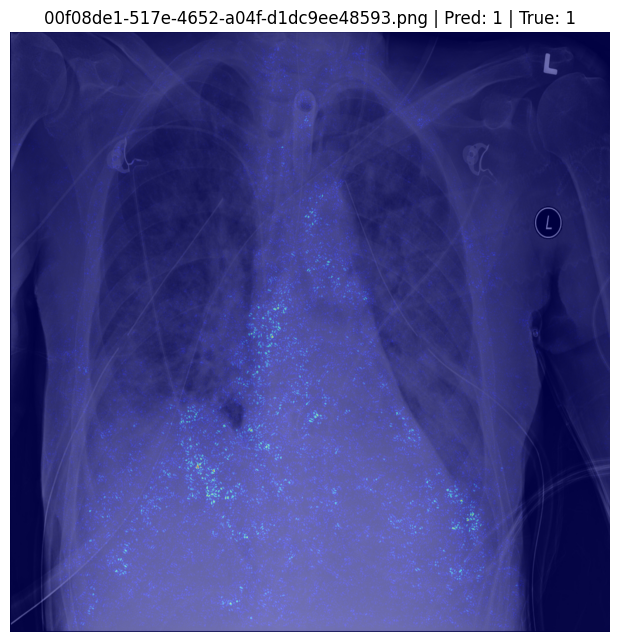

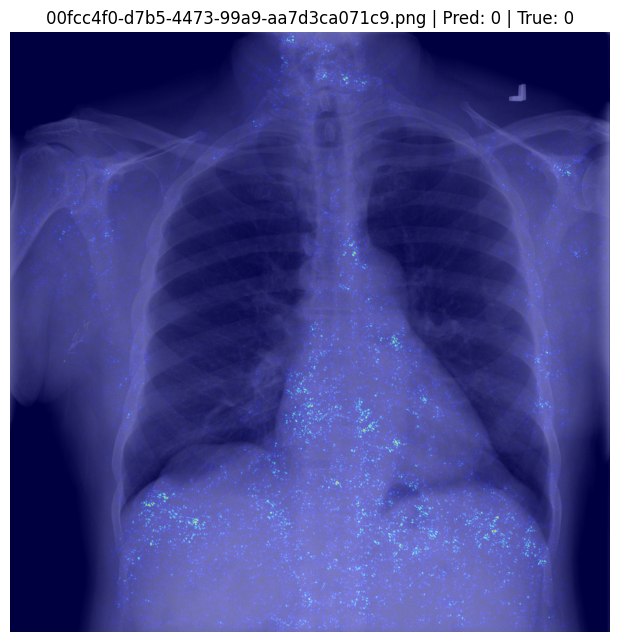

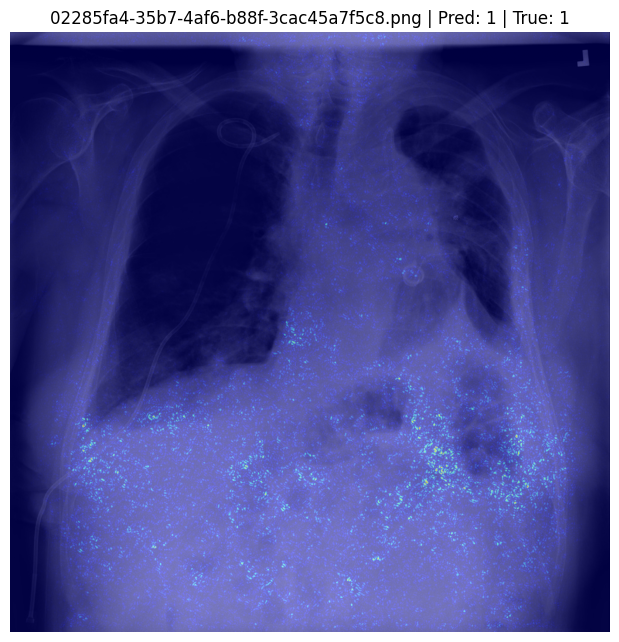

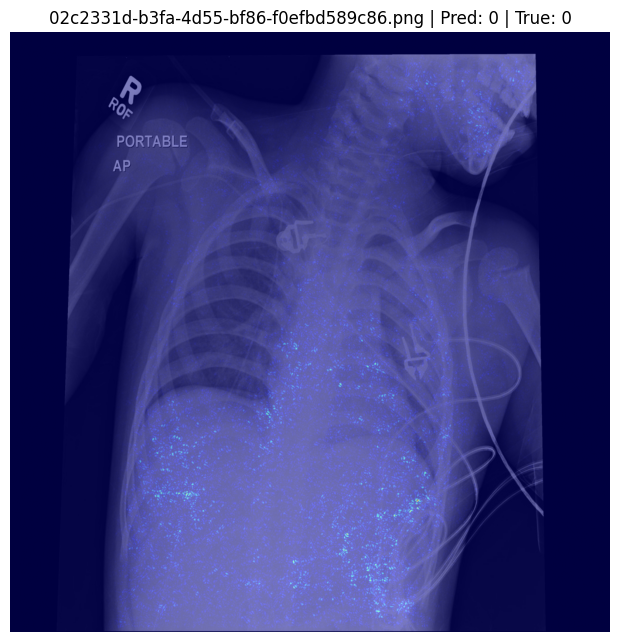

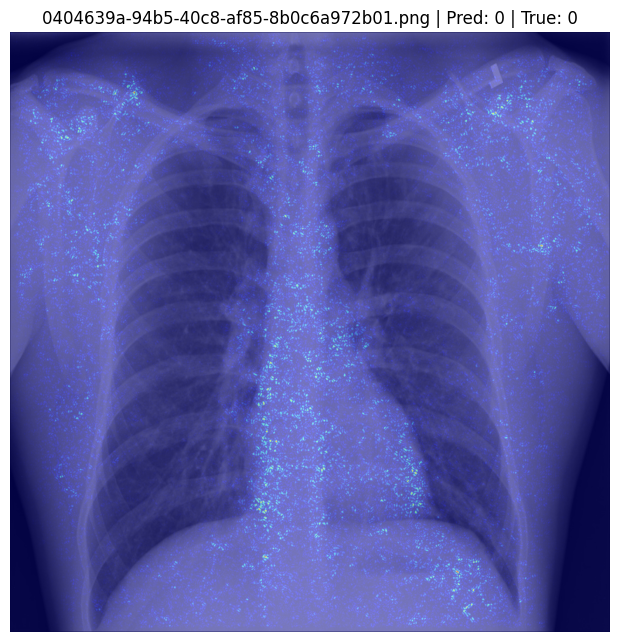

In [8]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from captum.attr import IntegratedGradients

STEPS = 20
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# ---------- Integrated Gradients ----------
ig = IntegratedGradients(model)

for i in range(5):  # test with one image first
    img_pil, img_tensor, label, fname = dataset[i]
    img_tensor = img_tensor.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        out = model(img_tensor)
        prob = torch.sigmoid(out)
        pred = int(prob > 0.5)

    baseline = torch.zeros_like(img_tensor).to(DEVICE)
    ig = IntegratedGradients(model)  # re-init each time to avoid buildup

    attributions, delta = ig.attribute(
        img_tensor,
        baselines=baseline,
        target=0,
        return_convergence_delta=True,
        n_steps=10  # reduced
    )

    attr = attributions.squeeze(0).cpu().detach().numpy()
    attr = np.sum(np.abs(attr), axis=0)
    attr = (attr - attr.min()) / (attr.max() - attr.min() + 1e-8)
    heatmap = cv2.applyColorMap(np.uint8(255 * attr), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0

    img_np = img_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
    combined = 0.5 * img_np + 0.5 * heatmap

    plt.figure(figsize=(6,6))
    plt.imshow(combined)
    plt.title(f"{fname} | Pred: {pred} | True: {label}")
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.margins(0, 0)
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.show()
    plt.close()


    import gc
    torch.cuda.empty_cache()
    gc.collect()


**Observations**:

Integrated Gradients' attributions are diffusely spread across the entire torso region, which is better than the Grad-CAM variants' activations, but its still not sharply confined to the lung region. This suggests that while the model has learned to associate pneumonia-relevant features with the general thoracic region, it can still learn better spatial boundaries. 

/Users/sathammai/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Processing sample 1/5

Processing sample 2/5

Processing sample 3/5

Processing sample 4/5

Processing sample 5/5


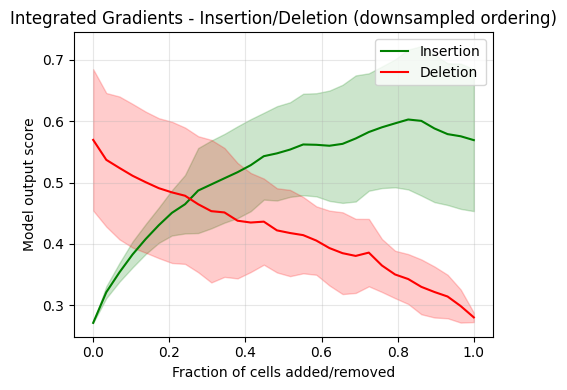


Insertion AUC : 0.5153 ± 0.0689
Deletion  AUC : 0.4192 ± 0.0727
Heatmap Entropy  : 13.1215 ± 0.1426
Heatmap Sparsity : 0.6795 ± 0.0495


In [3]:
# Memory-safe Integrated Gradients eval with insertion/deletion + entropy + sparsity
import torch
import numpy as np
import matplotlib.pyplot as plt
import gc
from tqdm import tqdm
from sklearn.metrics import auc
from captum.attr import IntegratedGradients
import torch.nn.functional as F
import cv2

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(DEVICE)
model.eval()

# ---------- Settings (safe defaults) ----------
num_samples = 5          # start small to avoid OOM; increase after testing
ig_steps = 10            # Integrated Gradients steps (lower -> faster)
heatmap_res = 14         # downsampled heatmap resolution (heatmap size used for ordering)
curve_steps = 30         # number of points in insertion/deletion curves
mask_block_resize = True # we will map small heatmap cells to blocks on the full image

# ---------- Helper functions ----------
def heatmap_entropy(heatmap):
    p = heatmap.flatten()
    p = p / (p.sum() + 1e-8)
    return -np.sum(p * np.log(p + 1e-8))

def heatmap_sparsity(heatmap):
    h = heatmap.flatten()
    N = len(h)
    return 1 - ((np.sum(np.abs(h)))**2) / (N * np.sum(h**2) + 1e-8)

def compute_ig_heatmap(ig, input_tensor, target, n_steps=10):
    """
    Returns a 2D numpy heatmap [H, W] aggregated over channels (abs sum).
    """
    attributions, delta = ig.attribute(
        input_tensor,
        target=target,
        baselines=torch.zeros_like(input_tensor).to(input_tensor.device),
        n_steps=n_steps,
        return_convergence_delta=True
    )
    # attributions shape: [1, C, H, W]
    heat = attributions.abs().sum(dim=1).squeeze(0).cpu().numpy()  # [H, W]
    heat = (heat - heat.min()) / (heat.max() - heat.min() + 1e-8)
    return heat

def apply_heatmap_curve_downsampled(img_tensor, heatmap_small, pred, model, mode="insertion", steps=30):
    """
    img_tensor: [1, C, H, W] original full tensor on DEVICE
    heatmap_small: 2D array sized heatmap_res x heatmap_res normalized 0-1
    We map small heatmap cells to blocks on HxW and perform insertion/deletion using block steps.
    """
    _, C, H, W = img_tensor.shape
    dh, dw = heatmap_small.shape
    # block size to cover full image (last block may be slightly larger)
    bh = int(np.ceil(H / dh))
    bw = int(np.ceil(W / dw))

    # flatten small heatmap indices sorted by importance
    flat_idx = np.argsort(heatmap_small.ravel())  # low -> high
    if mode == "insertion":
        indices_order = flat_idx[::-1]  # high importance first
        masked = torch.zeros_like(img_tensor)
    else:
        indices_order = flat_idx[::-1]  # remove high importance first
        masked = img_tensor.clone()

    total_cells = dh * dw
    step_cells = max(total_cells // steps, 1)

    scores = []
    for i in range(0, total_cells, step_cells):
        selected = indices_order[:i]  # small-grid cell indices to reveal/remove
        if len(selected) == 0:
            # evaluate on fully masked / original
            with torch.no_grad():
                out = model(masked.to(DEVICE))
                if out.shape[-1] > 1:
                    sc = torch.softmax(out, dim=1)[0, pred].item()
                else:
                    sc = torch.sigmoid(out)[0].item()
            scores.append(sc)
            continue

        # build mask over full resolution by expanding small cells to blocks
        # Use numpy to compute coordinates then apply to tensor
        ys_small = selected // dw
        xs_small = selected % dw

        # create boolean mask for original image pixels to set/unset
        mask_full = np.zeros((H, W), dtype=bool)
        for ys, xs in zip(ys_small, xs_small):
            y0 = ys * bh
            x0 = xs * bw
            y1 = min((ys + 1) * bh, H)
            x1 = min((xs + 1) * bw, W)
            mask_full[y0:y1, x0:x1] = True

        # apply mask to the tensor
        # masked: [1, C, H, W]
        if mode == "insertion":
            # copy selected pixels from original img_tensor into masked
            # build index arrays for broadcasting
            mask_t = torch.from_numpy(mask_full).to(DEVICE)  # [H,W]
            for ch in range(C):
                # masked[0,ch] is zero, fill masked where mask_full True
                masked[0, ch][mask_t] = img_tensor[0, ch].to(DEVICE)[mask_t]
        else:
            # deletion: set masked pixels to zero where mask_full True
            mask_t = torch.from_numpy(mask_full).to(DEVICE)
            for ch in range(C):
                masked[0, ch][mask_t] = 0.0

        with torch.no_grad():
            out = model(masked.to(DEVICE))
            if out.shape[-1] > 1:
                sc = torch.softmax(out, dim=1)[0, pred].item()
            else:
                sc = torch.sigmoid(out)[0].item()
        scores.append(sc)

    # interpolate to exactly `steps` points
    scores = np.interp(np.linspace(0, 1, steps),
                       np.linspace(0, 1, len(scores)), scores)
    return scores

# ---------- Main loop (memory-friendly) ----------
ig = IntegratedGradients(model)

insertion_curves, deletion_curves = [], []
entropy_list, sparsity_list = [], []

for i in range(num_samples):
    print(f"\nProcessing sample {i+1}/{num_samples}")
    _, img_tensor, label, fname = dataset[i]    # dataset returns (PIL, tensor, label, fname)
    # ensure tensor on device and shape [1,C,H,W]
    img_full = img_tensor.unsqueeze(0).to(DEVICE)

    # get model prediction
    with torch.no_grad():
        out = model(img_full)
        prob = torch.sigmoid(out)
        pred = int(prob > 0.5)

    # compute IG heatmap (full size)
    heat_full = compute_ig_heatmap(ig, img_full, target=0, n_steps=ig_steps) # [H,W] numpy

    # downsample heatmap for ordering (small grid)
    heat_small = cv2.resize(heat_full.astype(np.float32), (heatmap_res, heatmap_res), interpolation=cv2.INTER_AREA)
    heat_small = (heat_small - heat_small.min()) / (heat_small.max() - heat_small.min() + 1e-8)

    # compute curves using small-grid ordering but apply on full image blocks
    ins_curve = apply_heatmap_curve_downsampled(img_full, heat_small, pred, model, mode="insertion", steps=curve_steps)
    del_curve = apply_heatmap_curve_downsampled(img_full, heat_small, pred, model, mode="deletion", steps=curve_steps)

    insertion_curves.append(ins_curve)
    deletion_curves.append(del_curve)

    # compute entropy/sparsity on the (upsampled) full heatmap
    entropy_list.append(heatmap_entropy(heat_full))
    sparsity_list.append(heatmap_sparsity(heat_full))

    # cleanup
    del img_full, heat_full, heat_small, ins_curve, del_curve
    torch.cuda.empty_cache()
    gc.collect()

# ---------- Aggregate & plot ----------
insertion_curves_np = np.array(insertion_curves)
deletion_curves_np  = np.array(deletion_curves)
x = np.linspace(0, 1, curve_steps)

ins_mean, ins_std = insertion_curves_np.mean(0), insertion_curves_np.std(0)
del_mean, del_std = deletion_curves_np.mean(0), deletion_curves_np.std(0)

plt.figure(figsize=(5,4))
plt.plot(x, ins_mean, label="Insertion", color="green")
plt.fill_between(x, ins_mean - ins_std, ins_mean + ins_std, color="green", alpha=0.2)
plt.plot(x, del_mean, label="Deletion", color="red")
plt.fill_between(x, del_mean - del_std, del_mean + del_std, color="red", alpha=0.2)
plt.xlabel("Fraction of cells added/removed")
plt.ylabel("Model output score")
plt.title("Integrated Gradients - Insertion/Deletion (downsampled ordering)")
plt.legend(loc="upper right", frameon=True)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# AUCs and heatmap metrics
ins_aucs = [auc(x, c) for c in insertion_curves_np]
del_aucs = [auc(x, c) for c in deletion_curves_np]

print(f"\nInsertion AUC : {np.mean(ins_aucs):.4f} ± {np.std(ins_aucs):.4f}")
print(f"Deletion  AUC : {np.mean(del_aucs):.4f} ± {np.std(del_aucs):.4f}")
print(f"Heatmap Entropy  : {np.mean(entropy_list):.4f} ± {np.std(entropy_list):.4f}")
print(f"Heatmap Sparsity : {np.mean(sparsity_list):.4f} ± {np.std(sparsity_list):.4f}")


**Observations**:

The high Entropy confirms that the attribution maps are spatially diffused (the entire torso region rather than just the lung region). The moderate Sparsity suggests that while many pixels are active, there's still some concentration. This is also highlighted by the gradually increasing Insertion curve and decreasing Deletion curve, indicating that the model, even though it's selective, its focus remains spread out.

## Localization:
To enhance spatial interpretability, the model was additionally trained for bounding box regression using the ground-truth annotations provided by the dataset.

In [ ]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torch
import torch.nn as nn
import pandas as pd
import os
from torchvision import transforms, models

# ---- Dataset ----
class RSNALocalizationDataset(Dataset):
    def __init__(self, image_dir, csv_path, img_size=224, transform=None):
        self.image_dir = image_dir
        self.df = pd.read_csv(csv_path)
        self.filenames = self.df['patientId'].unique()
        self.img_size = img_size
        self.transform = transform or transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406],
                                 [0.229, 0.224, 0.225])
        ])
        
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        pid = self.filenames[idx]
        img_path = os.path.join(self.image_dir, pid + ".png")
        img = Image.open(img_path).convert("RGB")
        img_tensor = self.transform(img)
        
        # Classification label
        label = int((self.df[self.df['patientId'] == pid]['Target'].sum()) > 0)
        
        # Bounding box (normalize by original size)
        boxes = self.df[(self.df['patientId'] == pid) & (self.df['Target'] == 1)]
        if not boxes.empty:
            box = boxes.iloc[0]
            w_orig, h_orig = img.size
            bbox = torch.tensor([
                box['x'] / w_orig,
                box['y'] / h_orig,
                box['width'] / w_orig,
                box['height'] / h_orig
            ], dtype=torch.float32)
        else:
            bbox = torch.zeros(4, dtype=torch.float32)
        
        return img_tensor, torch.tensor(label, dtype=torch.float32), bbox


# ---- Model ----
class DenseNetLocalization(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        base = models.densenet121(pretrained=pretrained)
        self.backbone = base.features
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.flatten = nn.Flatten()
        self.classifier = nn.Linear(1024, 1)  # binary
        self.bbox_regressor = nn.Linear(1024, 4)
    
    def forward(self, x):
        features = self.backbone(x)
        pooled = self.avgpool(features)
        flat = self.flatten(pooled)
        cls = self.classifier(flat)
        bbox = self.bbox_regressor(flat)
        return cls, bbox


# ---- Loss ----
cls_loss_fn = nn.BCEWithLogitsLoss()
bbox_loss_fn = nn.SmoothL1Loss()

def combined_loss(pred_cls, target_cls, pred_bbox, target_bbox, alpha=1.0):
    cls_loss = cls_loss_fn(pred_cls.squeeze(), target_cls)
    bbox_loss = bbox_loss_fn(pred_bbox, target_bbox)
    return cls_loss + alpha * bbox_loss


# ---- Training ----
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

IMAGE_DIR = "/Users/sathammai/Downloads/RSNA_subset1/images"  
CSV_PATH = "/Users/sathammai/Downloads/RSNA_subset1/labels_subset.csv"  

dataset = RSNALocalizationDataset(IMAGE_DIR, CSV_PATH, img_size=224)
loader = DataLoader(dataset, batch_size=8, shuffle=True, num_workers=0)

model = DenseNetLocalization(pretrained=True).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

EPOCHS = 12
SAVE_PATH = "/Users/sathammai/Downloads/RSNA_subset1/localization_densenet121_rsna.pth"

for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    for imgs, labels, bboxes in loader:
        imgs, labels, bboxes = imgs.to(DEVICE), labels.to(DEVICE), bboxes.to(DEVICE)
        optimizer.zero_grad()
        pred_cls, pred_bbox = model(imgs)
        loss = combined_loss(pred_cls, labels, pred_bbox, bboxes)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    
    avg_loss = running_loss / len(loader)
    print(f"Epoch {epoch+1}/{EPOCHS} | Loss: {avg_loss:.4f}")

# ---- Save the trained model ----
torch.save(model.state_dict(), SAVE_PATH)
print(f"Model saved successfully to {SAVE_PATH}")


In [ ]:
# ---------- DATASET ----------
class RSNADataset(Dataset):
    def __init__(self, image_dir, csv_path, transform=None):
        self.image_dir = image_dir
        self.df = pd.read_csv(csv_path)
        self.filenames = sorted(os.listdir(image_dir))[:NUM_IMAGES]  # limit to 20
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        img_path = os.path.join(self.image_dir, fname)
        img = Image.open(img_path).convert("RGB")

        if self.transform:
            img_tensor = self.transform(img)
        else:
            img_tensor = transforms.ToTensor()(img)

        pid = os.path.splitext(fname)[0]
        label = int((self.df[self.df['patientId'] == pid]['Target'].sum()) > 0)

        return img, img_tensor, label, fname  # return both PIL and tensor

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

dataset = RSNADataset(IMAGE_DIR, CSV_PATH, transform=transform)


  0%|          | 0/5 [00:00<?, ?it/s]

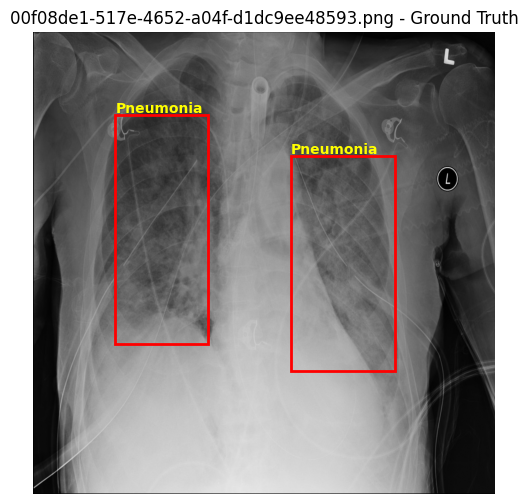

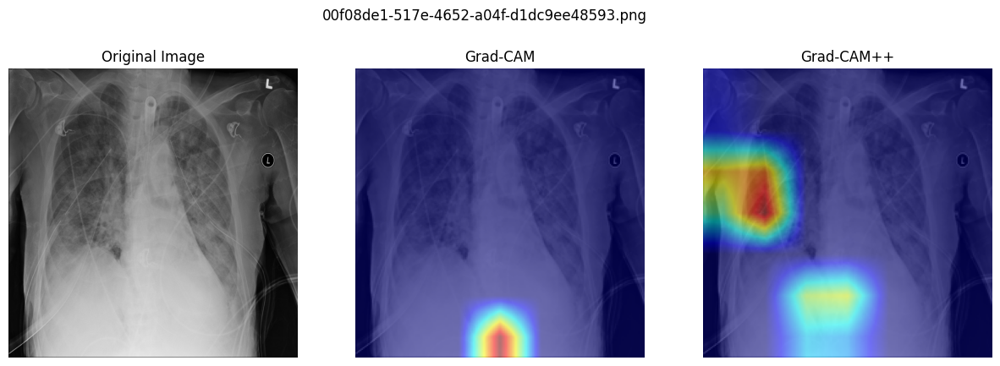

 20%|██        | 1/5 [00:00<00:01,  2.31it/s]

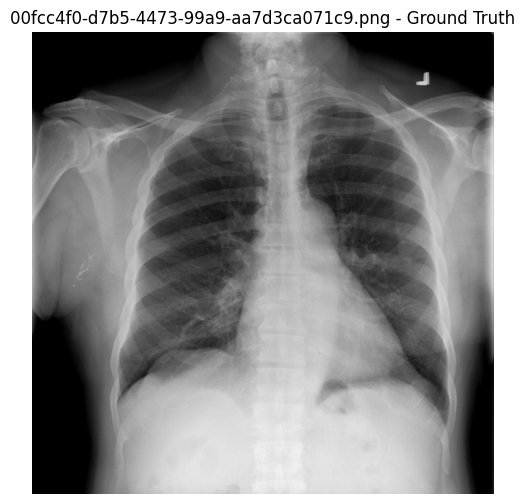

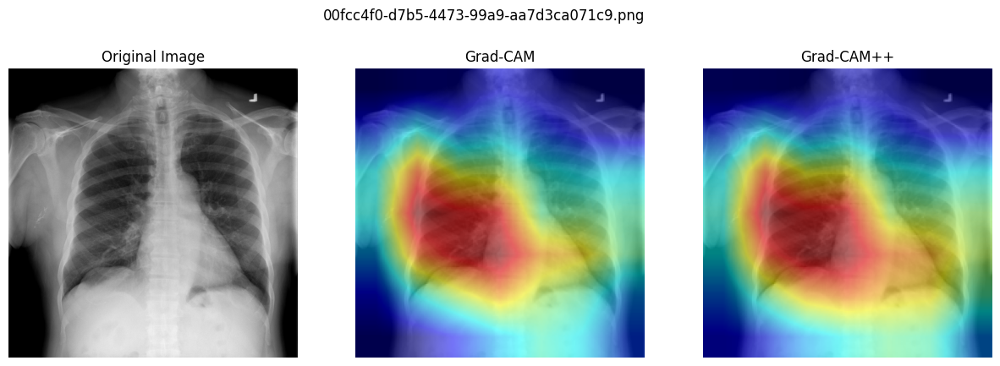

 40%|████      | 2/5 [00:00<00:01,  2.55it/s]

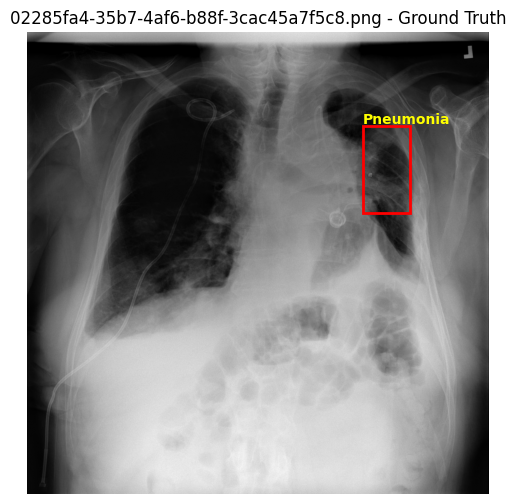

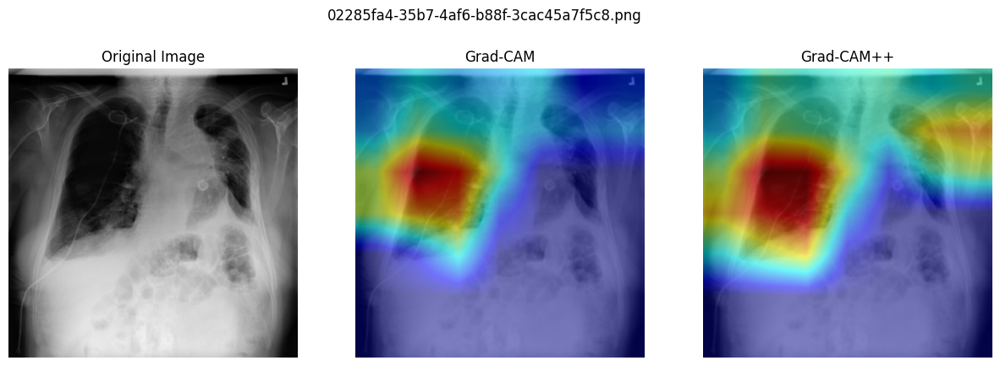

 60%|██████    | 3/5 [00:01<00:00,  2.67it/s]

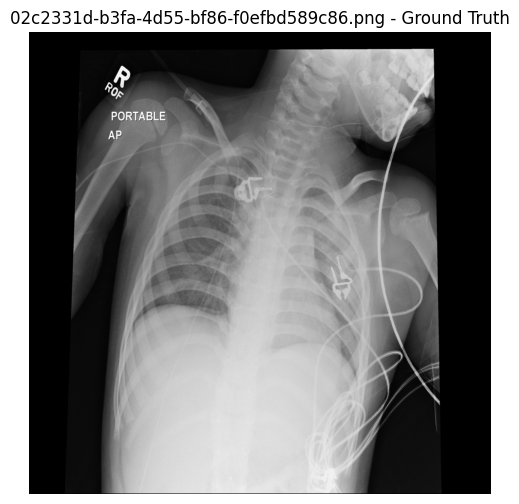

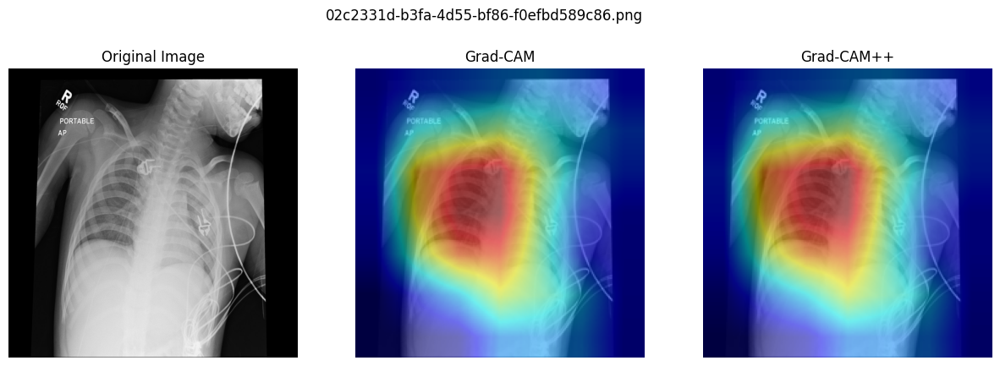

 80%|████████  | 4/5 [00:01<00:00,  2.69it/s]

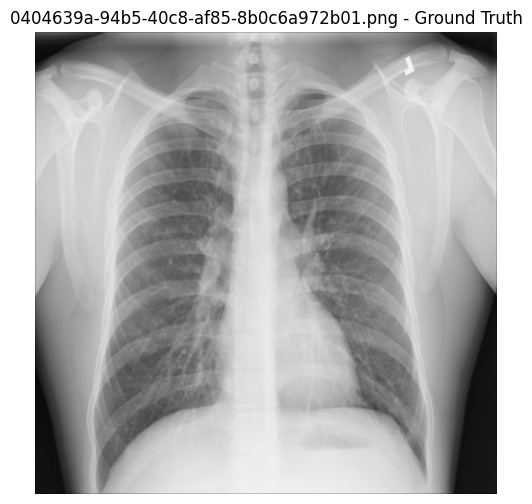

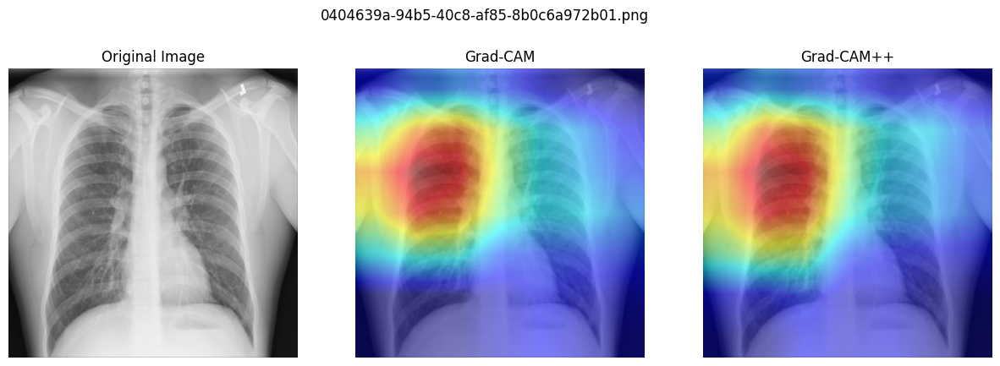

100%|██████████| 5/5 [00:01<00:00,  2.63it/s]


In [ ]:
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget, ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import torch
from tqdm import tqdm

target_layer = model.backbone.denseblock4.denselayer16.conv2
gradcam = GradCAM(model=model, target_layers=[target_layer])
gradcam_pp = GradCAMPlusPlus(model=model, target_layers=[target_layer])

df = pd.read_csv(CSV_PATH)

for i in tqdm(range(len(dataset))):
    pil_img, img_tensor, label, fname = dataset[i]

    orig_np = np.array(pil_img) / 255.0
    pid = os.path.splitext(fname)[0]
    boxes = df[df['patientId'] == pid]

    # --- Ground truth visualization ---
    gt_fig, gt_ax = plt.subplots(1, figsize=(6, 6))
    gt_ax.imshow(orig_np)
    if not boxes.empty:
        for _, row in boxes.iterrows():
            if row['Target'] == 1:
                x, y, w, h = row['x'], row['y'], row['width'], row['height']
                rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
                gt_ax.add_patch(rect)
                gt_ax.text(x, y - 5, 'Pneumonia', color='yellow', fontsize=10, weight='bold')
    else:
        gt_ax.text(10, 20, 'No bounding box', color='cyan', fontsize=12, weight='bold')

    gt_ax.axis('off')
    gt_ax.set_title(f"{fname} - Ground Truth")

    # --- Model prediction ---
    normalized_tensor = model_transform(pil_img).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        pred_cls, pred_bbox = model(normalized_tensor)

    target = [BinaryClassifierOutputTarget(0)]  # pneumonia output

    # --- Grad-CAM ---
    cam = gradcam(input_tensor=normalized_tensor, targets=target)
    heatmap = (cam[0] - cam[0].min()) / (cam[0].max() - cam[0].min() + 1e-8)
    cam_image = show_cam_on_image(np.array(pil_img.resize((IMG_SIZE, IMG_SIZE))) / 255.0, heatmap, use_rgb=True)

    # --- Grad-CAM++ ---
    cam_pp = gradcam_pp(input_tensor=normalized_tensor, targets=target)
    heatmap_pp = (cam_pp[0] - cam_pp[0].min()) / (cam_pp[0].max() - cam_pp[0].min() + 1e-8)
    cam_pp_image = show_cam_on_image(np.array(pil_img.resize((IMG_SIZE, IMG_SIZE))) / 255.0, heatmap_pp, use_rgb=True)

    # --- Plot all together ---
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(orig_np)
    axes[0].set_title('Original Image')
    axes[1].imshow(cam_image)
    axes[1].set_title('Grad-CAM')
    axes[2].imshow(cam_pp_image)
    axes[2].set_title('Grad-CAM++')

    for ax in axes:
        ax.axis('off')

    plt.suptitle(fname)
    plt.show()


**Observations**:

After localization, the Grad-CAM variants' activations highlight the lung regions better than it did prior to the localization.

Grad-CAM Insertion/Deletion: 100%|██████████| 5/5 [00:12<00:00,  2.48s/it]


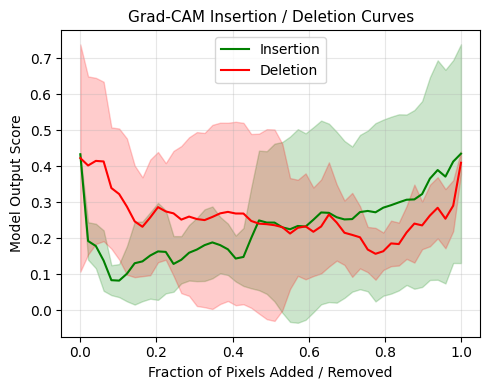

Insertion AUC : 0.2275 ± 0.1596
Deletion  AUC : 0.2575 ± 0.1124
Heatmap Entropy  : 10.1970 ± 0.4052
Heatmap Sparsity : 0.4911 ± 0.2155


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from tqdm import tqdm
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

def apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="insertion", steps=50):
    _, C, H, W = img_tensor.shape
    flat_idx = np.argsort(heatmap.ravel())  # low → high importance

    if mode == "insertion":
        masked_img = torch.zeros_like(img_tensor)
        indices_order = flat_idx[::-1]
    elif mode == "deletion":
        masked_img = img_tensor.clone()
        indices_order = flat_idx[::-1]
    else:
        raise ValueError("mode must be 'insertion' or 'deletion'")

    scores = []
    total_pixels = H * W
    step_size = max(total_pixels // steps, 1)

    for i in range(0, total_pixels, step_size):
        idx = indices_order[:i]
        ys, xs = idx // W, idx % W

        if mode == "insertion":
            masked_img[:, :, ys, xs] = img_tensor[:, :, ys, xs]
        else:  # deletion
            masked_img[:, :, ys, xs] = 0

        with torch.no_grad():
            out = model(masked_img.to(DEVICE))

            # unpack classification output
            if isinstance(out, tuple):
                pred_cls = out[0]
            else:
                pred_cls = out

            if pred_cls.shape[-1] > 1:
                score = torch.softmax(pred_cls, dim=1)[0, pred].item()
            else:
                score = torch.sigmoid(pred_cls)[0].item()
        scores.append(score)

    scores = np.interp(np.linspace(0, 1, steps),
                       np.linspace(0, 1, len(scores)), scores)
    return scores



def heatmap_entropy(heatmap):
    """Entropy: how spread-out the Grad-CAM is"""
    p = heatmap.flatten()
    p = p / (p.sum() + 1e-8)
    return -np.sum(p * np.log(p + 1e-8))


def heatmap_sparsity(heatmap):
    """Sparsity: how concentrated the Grad-CAM is"""
    h = heatmap.flatten()
    N = len(h)
    return 1 - ((np.sum(np.abs(h)))**2) / (N * np.sum(h**2) + 1e-8)


# ---------- Main Evaluation ----------
insertion_curves, deletion_curves = [], []
entropy_list, sparsity_list = [], []
num_samples = 5  # number of test images

target_layer = model.backbone.denseblock4.denselayer16.conv2
cam = GradCAM(model=model, target_layers=[target_layer])

for i in tqdm(range(num_samples), desc="Grad-CAM Insertion/Deletion"):
    _, img_tensor, label, fname = dataset[i]
    img_tensor = img_tensor.unsqueeze(0).to(DEVICE)

    # model prediction
    with torch.no_grad():
        pred_cls, pred_bbox = model(img_tensor)
        prob = torch.sigmoid(pred_cls)
        pred = int(prob > 0.5)


    # ---------- Grad-CAM ----------
    grayscale_cam = cam(input_tensor=img_tensor, targets=[BinaryClassifierOutputTarget(pred)])
    heatmap = grayscale_cam[0]
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    # ---------- Curves ----------
    insertion_curve = apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="insertion")
    deletion_curve  = apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="deletion")
    insertion_curves.append(insertion_curve)
    deletion_curves.append(deletion_curve)

    # ---------- Heatmap Metrics ----------
    entropy_val = heatmap_entropy(heatmap)
    sparsity_val = heatmap_sparsity(heatmap)
    entropy_list.append(entropy_val)
    sparsity_list.append(sparsity_val)


# ---------- Aggregate & Plot ----------
steps = 50
x = np.linspace(0, 1, steps)

insertion_curves_np = np.array(insertion_curves)
deletion_curves_np  = np.array(deletion_curves)

insertion_mean, insertion_std = insertion_curves_np.mean(0), insertion_curves_np.std(0)
deletion_mean, deletion_std   = deletion_curves_np.mean(0), deletion_curves_np.std(0)

# AUCs
insertion_aucs = [auc(x, c) for c in insertion_curves_np]
deletion_aucs  = [auc(x, c) for c in deletion_curves_np]
ins_auc_mean, ins_auc_std = np.mean(insertion_aucs), np.std(insertion_aucs)
del_auc_mean, del_auc_std = np.mean(deletion_aucs), np.std(deletion_aucs)

# ---------- Plot Curves ----------
plt.figure(figsize=(5, 4))
plt.plot(x, insertion_mean, label="Insertion", color="green")
plt.fill_between(x, insertion_mean - insertion_std, insertion_mean + insertion_std, color="green", alpha=0.2)
plt.plot(x, deletion_mean, label="Deletion", color="red")
plt.fill_between(x, deletion_mean - deletion_std, deletion_mean + deletion_std, color="red", alpha=0.2)

plt.xlabel("Fraction of Pixels Added / Removed")
plt.ylabel("Model Output Score")
plt.title("Grad-CAM Insertion / Deletion Curves", fontsize=11)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ---------- Metric Summary ----------
ent_mean, ent_std = np.mean(entropy_list), np.std(entropy_list)
sparse_mean, sparse_std = np.mean(sparsity_list), np.std(sparsity_list)


print(f"Insertion AUC : {ins_auc_mean:.4f} ± {ins_auc_std:.4f}")
print(f"Deletion  AUC : {del_auc_mean:.4f} ± {del_auc_std:.4f}")
print(f"Heatmap Entropy  : {ent_mean:.4f} ± {ent_std:.4f}")
print(f"Heatmap Sparsity : {sparse_mean:.4f} ± {sparse_std:.4f}")



**Observations**:

The sharp decrease in Entropy after localization quantitatively indicates that the Grad-CAM heatmaps have become more focused. The moderate Sparsity suggests that this focus is not concentrated in a single region but rather spread across multiple relevant areas. This pattern is reflected in the Insertion and Deletion curves, which change gradually, suggesting that while the localized regions are critical, they contribute more uniformly to the model’s predictions.

Grad-CAM++ Insertion/Deletion: 100%|██████████| 5/5 [00:12<00:00,  2.40s/it]


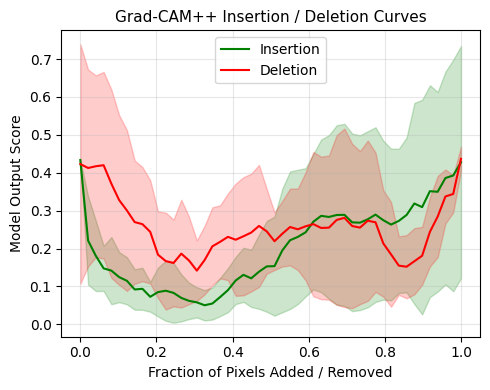

Insertion AUC : 0.1992 ± 0.1177
Deletion  AUC : 0.2523 ± 0.1103
Heatmap Entropy  : 10.5413 ± 0.1697
Heatmap Sparsity : 0.3063 ± 0.1398


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from tqdm import tqdm
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"


# ---------- Helper Functions ----------
def apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="insertion", steps=50):
    _, C, H, W = img_tensor.shape
    flat_idx = np.argsort(heatmap.ravel())  # low → high importance

    if mode == "insertion":
        masked_img = torch.zeros_like(img_tensor)
        indices_order = flat_idx[::-1]
    elif mode == "deletion":
        masked_img = img_tensor.clone()
        indices_order = flat_idx[::-1]
    else:
        raise ValueError("mode must be 'insertion' or 'deletion'")

    scores = []
    total_pixels = H * W
    step_size = max(total_pixels // steps, 1)

    for i in range(0, total_pixels, step_size):
        idx = indices_order[:i]
        ys, xs = idx // W, idx % W

        if mode == "insertion":
            masked_img[:, :, ys, xs] = img_tensor[:, :, ys, xs]
        else:  # deletion
            masked_img[:, :, ys, xs] = 0

        with torch.no_grad():
            out = model(masked_img.to(DEVICE))

            # unpack classification output
            if isinstance(out, tuple):
                pred_cls = out[0]
            else:
                pred_cls = out

            if pred_cls.shape[-1] > 1:
                score = torch.softmax(pred_cls, dim=1)[0, pred].item()
            else:
                score = torch.sigmoid(pred_cls)[0].item()
        scores.append(score)

    scores = np.interp(np.linspace(0, 1, steps),
                       np.linspace(0, 1, len(scores)), scores)
    return scores


def heatmap_entropy(heatmap):
    """Entropy: how spread-out the Grad-CAM is"""
    p = heatmap.flatten()
    p = p / (p.sum() + 1e-8)
    return -np.sum(p * np.log(p + 1e-8))


def heatmap_sparsity(heatmap):
    """Sparsity: how concentrated the Grad-CAM is"""
    h = heatmap.flatten()
    N = len(h)
    return 1 - ((np.sum(np.abs(h)))**2) / (N * np.sum(h**2) + 1e-8)


# ---------- Main Evaluation ----------
insertion_curves, deletion_curves = [], []
entropy_list, sparsity_list = [], []
num_samples = 5  # number of test images

target_layer = model.backbone.denseblock4.denselayer16.conv2
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

for i in tqdm(range(num_samples), desc="Grad-CAM++ Insertion/Deletion"):
    _, img_tensor, label, fname = dataset[i]
    img_tensor = img_tensor.unsqueeze(0).to(DEVICE)

    # model prediction
    with torch.no_grad():
        pred_cls, pred_bbox = model(img_tensor)
        prob = torch.sigmoid(pred_cls)
        pred = int(prob > 0.5)

    # ---------- Grad-CAM++ ----------
    grayscale_cam = cam(input_tensor=img_tensor, targets=[BinaryClassifierOutputTarget(pred)])
    heatmap = grayscale_cam[0]
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    # ---------- Curves ----------
    insertion_curve = apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="insertion")
    deletion_curve  = apply_heatmap_curve(img_tensor, heatmap, pred, model, mode="deletion")
    insertion_curves.append(insertion_curve)
    deletion_curves.append(deletion_curve)

    # ---------- Heatmap Metrics ----------
    entropy_val = heatmap_entropy(heatmap)
    sparsity_val = heatmap_sparsity(heatmap)
    entropy_list.append(entropy_val)
    sparsity_list.append(sparsity_val)


# ---------- Aggregate & Plot ----------
steps = 50
x = np.linspace(0, 1, steps)

insertion_curves_np = np.array(insertion_curves)
deletion_curves_np  = np.array(deletion_curves)

insertion_mean, insertion_std = insertion_curves_np.mean(0), insertion_curves_np.std(0)
deletion_mean, deletion_std   = deletion_curves_np.mean(0), deletion_curves_np.std(0)

# AUCs
insertion_aucs = [auc(x, c) for c in insertion_curves_np]
deletion_aucs  = [auc(x, c) for c in deletion_curves_np]
ins_auc_mean, ins_auc_std = np.mean(insertion_aucs), np.std(insertion_aucs)
del_auc_mean, del_auc_std = np.mean(deletion_aucs), np.std(deletion_aucs)

# ---------- Plot Curves ----------
plt.figure(figsize=(5, 4))
plt.plot(x, insertion_mean, label="Insertion", color="green")
plt.fill_between(x, insertion_mean - insertion_std, insertion_mean + insertion_std, color="green", alpha=0.2)
plt.plot(x, deletion_mean, label="Deletion", color="red")
plt.fill_between(x, deletion_mean - deletion_std, deletion_mean + deletion_std, color="red", alpha=0.2)

plt.xlabel("Fraction of Pixels Added / Removed")
plt.ylabel("Model Output Score")
plt.title("Grad-CAM++ Insertion / Deletion Curves", fontsize=11)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ---------- Metric Summary ----------
ent_mean, ent_std = np.mean(entropy_list), np.std(entropy_list)
sparse_mean, sparse_std = np.mean(sparsity_list), np.std(sparsity_list)

print(f"Insertion AUC : {ins_auc_mean:.4f} ± {ins_auc_std:.4f}")
print(f"Deletion  AUC : {del_auc_mean:.4f} ± {del_auc_std:.4f}")
print(f"Heatmap Entropy  : {ent_mean:.4f} ± {ent_std:.4f}")
print(f"Heatmap Sparsity : {sparse_mean:.4f} ± {sparse_std:.4f}")


**Observations**:

After localization, the Grad-CAM++ heatmaps also exhibit a reduction in Entropy, confirming that the attention has become more focused and less diffuse. The increase in Sparsity further indicates that the irrelevant activations were suppressed, resulting in fewer but more salient regions. The gradual change in Insertion/Deletion curves suggest that the while these localized areas are critical, they have a more uniform contribution to the model's decision making process. 

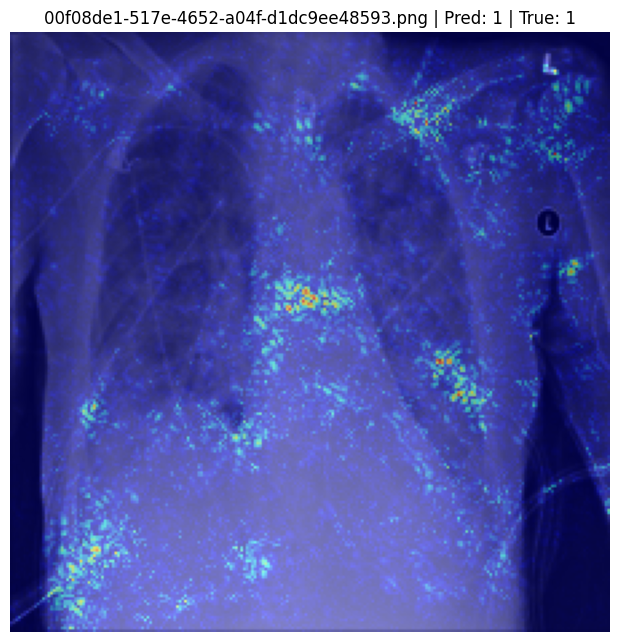

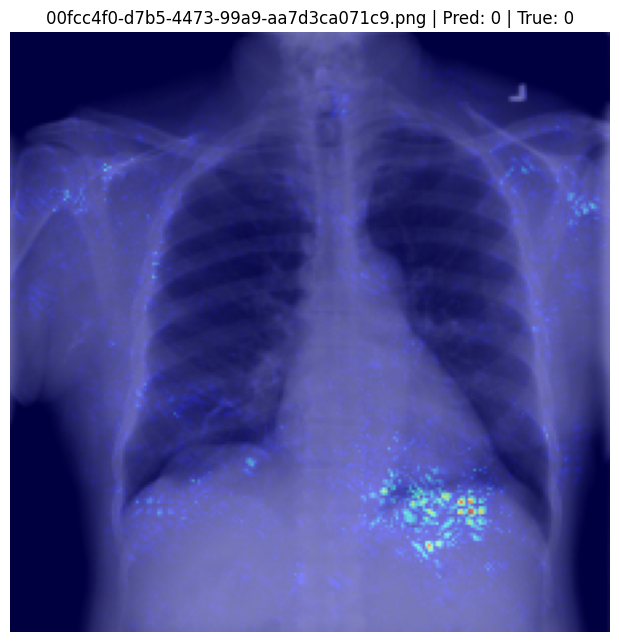

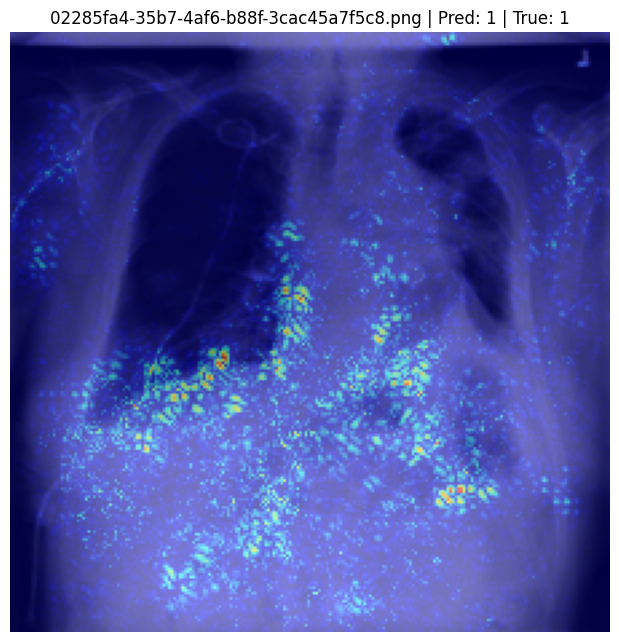

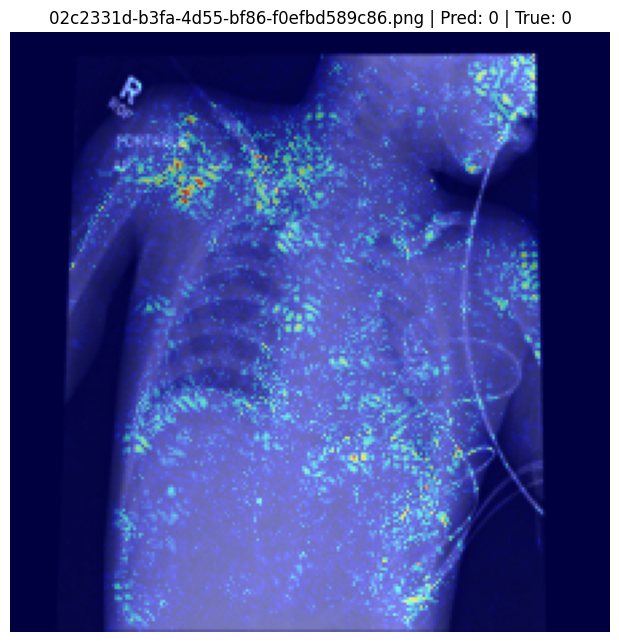

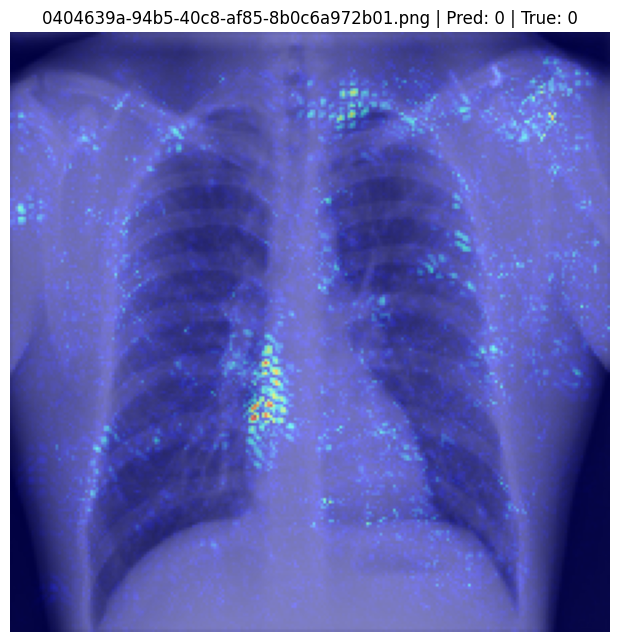

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from captum.attr import IntegratedGradients
import gc

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
STEPS = 20

def get_classification_output(model, x):
    """Ensure consistent output extraction for models returning multiple heads."""
    out = model(x)
    if isinstance(out, tuple):
        pred_cls = out[0]
    else:
        pred_cls = out
    return pred_cls

# ---------- Integrated Gradients ----------
ig = IntegratedGradients(get_classification_output)

for i in range(5):  # adjust number of samples
    img_pil, img_tensor, label, fname = dataset[i]
    img_tensor = img_tensor.unsqueeze(0).to(DEVICE)

    # model prediction
    with torch.no_grad():
        pred_cls = get_classification_output(model, img_tensor)
        prob = torch.sigmoid(pred_cls)
        pred = int(prob > 0.5)

    # ---------- IG Attribution ----------
    baseline = torch.zeros_like(img_tensor).to(DEVICE)
    ig = IntegratedGradients(lambda x: get_classification_output(model, x))  # re-init safely

    attributions, delta = ig.attribute(
        img_tensor,
        baselines=baseline,
        target=0,
        return_convergence_delta=True,
        n_steps=STEPS
    )

    # ---------- Normalize Attribution ----------
    attr = attributions.squeeze(0).cpu().detach().numpy()
    attr = np.sum(np.abs(attr), axis=0)
    attr = (attr - attr.min()) / (attr.max() - attr.min() + 1e-8)

    # ---------- Overlay ----------
    heatmap = cv2.applyColorMap(np.uint8(255 * attr), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0

    img_np = img_tensor.squeeze(0).cpu().permute(1, 2, 0).numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
    combined = 0.5 * img_np + 0.5 * heatmap

    # ---------- Plot ----------
    plt.figure(figsize=(6, 6))
    plt.imshow(combined)
    plt.title(f"{fname} | Pred: {pred} | True: {label}")
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.margins(0, 0)
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.show()
    plt.close()

    torch.cuda.empty_cache()
    gc.collect()


**Observations**:

The activations have become stronger after localization because earlier, even though IG already highlighted the lung pixels, the signal wasn't strong because the model's attention was spread across both the actual lung regions and spurious proxies. However, after localization, since the model was explicitly trained to focus on the lung regions, the gradient flow through these pixels are stronger, causing IG to produce stronger activations.

Note: The activations are still spread across the thoracic region because IG captures all pixels contributing to the prediction, including contextual or surrounding areas, not just the exact lung region.


Processing sample 1/5

Processing sample 2/5

Processing sample 3/5

Processing sample 4/5

Processing sample 5/5


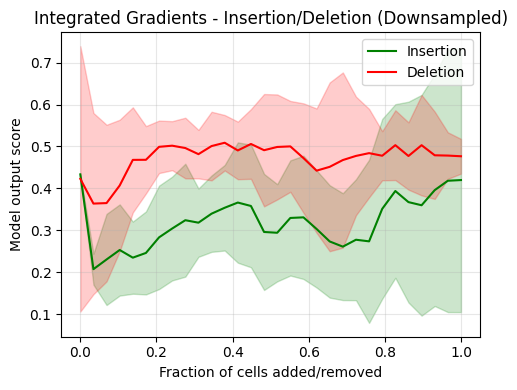


Insertion AUC : 0.3165 ± 0.1321
Deletion  AUC : 0.4728 ± 0.0512
Heatmap Entropy  : 10.3312 ± 0.1215
Heatmap Sparsity : 0.5582 ± 0.0663


In [ ]:
# Memory-safe Integrated Gradients eval with insertion/deletion + entropy + sparsity
import torch
import numpy as np
import matplotlib.pyplot as plt
import gc
from tqdm import tqdm
from sklearn.metrics import auc
from captum.attr import IntegratedGradients
import torch.nn.functional as F
import cv2

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(DEVICE)
model.eval()

# ---------- Settings ----------
num_samples = 5          # start small to avoid OOM
ig_steps = 10            # IG steps
heatmap_res = 14         # small-grid resolution for ordering
curve_steps = 30         # insertion/deletion curve points
mask_block_resize = True # block mapping toggle

# ---------- Helper functions ----------
def get_pred_logits(model, x):
    """Handle models that return (cls, bbox) or single output."""
    out = model(x)
    if isinstance(out, tuple):
        pred_cls = out[0]
    else:
        pred_cls = out
    return pred_cls

def heatmap_entropy(heatmap):
    p = heatmap.flatten()
    p = p / (p.sum() + 1e-8)
    return -np.sum(p * np.log(p + 1e-8))

def heatmap_sparsity(heatmap):
    h = heatmap.flatten()
    N = len(h)
    return 1 - ((np.sum(np.abs(h)))**2) / (N * np.sum(h**2) + 1e-8)

def compute_ig_heatmap(model, input_tensor, target, n_steps=10):
    """Returns 2D numpy heatmap aggregated over channels."""
    ig = IntegratedGradients(lambda x: get_pred_logits(model, x))
    attributions, delta = ig.attribute(
        input_tensor,
        target=target,
        baselines=torch.zeros_like(input_tensor).to(input_tensor.device),
        n_steps=n_steps,
        return_convergence_delta=True
    )
    heat = attributions.abs().sum(dim=1).squeeze(0).cpu().numpy()
    heat = (heat - heat.min()) / (heat.max() - heat.min() + 1e-8)
    return heat

def apply_heatmap_curve_downsampled(img_tensor, heatmap_small, pred, model, mode="insertion", steps=30):
    """Downsample-based insertion/deletion."""
    _, C, H, W = img_tensor.shape
    dh, dw = heatmap_small.shape
    bh, bw = int(np.ceil(H / dh)), int(np.ceil(W / dw))

    flat_idx = np.argsort(heatmap_small.ravel())  # low→high
    indices_order = flat_idx[::-1]
    masked = torch.zeros_like(img_tensor) if mode == "insertion" else img_tensor.clone()

    total_cells = dh * dw
    step_cells = max(total_cells // steps, 1)
    scores = []

    for i in range(0, total_cells, step_cells):
        selected = indices_order[:i]
        mask_full = np.zeros((H, W), dtype=bool)

        for idx in selected:
            ys, xs = divmod(idx, dw)
            y0, x0 = ys * bh, xs * bw
            y1, x1 = min((ys + 1) * bh, H), min((xs + 1) * bw, W)
            mask_full[y0:y1, x0:x1] = True

        mask_t = torch.from_numpy(mask_full).to(DEVICE)
        for ch in range(C):
            if mode == "insertion":
                masked[0, ch][mask_t] = img_tensor[0, ch][mask_t]
            else:
                masked[0, ch][mask_t] = 0.0

        with torch.no_grad():
            pred_cls = get_pred_logits(model, masked)
            if pred_cls.shape[-1] > 1:
                sc = torch.softmax(pred_cls, dim=1)[0, pred].item()
            else:
                sc = torch.sigmoid(pred_cls)[0].item()
        scores.append(sc)

    scores = np.interp(np.linspace(0, 1, steps),
                       np.linspace(0, 1, len(scores)), scores)
    return scores


# ---------- Main loop ----------
insertion_curves, deletion_curves = [], []
entropy_list, sparsity_list = [], []

for i in range(num_samples):
    print(f"\nProcessing sample {i+1}/{num_samples}")
    _, img_tensor, label, fname = dataset[i]
    img_full = img_tensor.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred_cls = get_pred_logits(model, img_full)
        prob = torch.sigmoid(pred_cls)
        pred = int(prob > 0.5)

    heat_full = compute_ig_heatmap(model, img_full, target=0, n_steps=ig_steps)
    heat_small = cv2.resize(heat_full.astype(np.float32), (heatmap_res, heatmap_res), interpolation=cv2.INTER_AREA)
    heat_small = (heat_small - heat_small.min()) / (heat_small.max() - heat_small.min() + 1e-8)

    ins_curve = apply_heatmap_curve_downsampled(img_full, heat_small, pred, model, mode="insertion", steps=curve_steps)
    del_curve = apply_heatmap_curve_downsampled(img_full, heat_small, pred, model, mode="deletion", steps=curve_steps)

    insertion_curves.append(ins_curve)
    deletion_curves.append(del_curve)

    entropy_list.append(heatmap_entropy(heat_full))
    sparsity_list.append(heatmap_sparsity(heat_full))

    del img_full, heat_full, heat_small, ins_curve, del_curve
    torch.cuda.empty_cache()
    gc.collect()

# ---------- Aggregate & Plot ----------
insertion_curves_np = np.array(insertion_curves)
deletion_curves_np  = np.array(deletion_curves)
x = np.linspace(0, 1, curve_steps)

ins_mean, ins_std = insertion_curves_np.mean(0), insertion_curves_np.std(0)
del_mean, del_std = deletion_curves_np.mean(0), deletion_curves_np.std(0)

plt.figure(figsize=(5,4))
plt.plot(x, ins_mean, label="Insertion", color="green")
plt.fill_between(x, ins_mean - ins_std, ins_mean + ins_std, color="green", alpha=0.2)
plt.plot(x, del_mean, label="Deletion", color="red")
plt.fill_between(x, del_mean - del_std, del_mean + del_std, color="red", alpha=0.2)
plt.xlabel("Fraction of cells added/removed")
plt.ylabel("Model output score")
plt.title("Integrated Gradients - Insertion/Deletion (Downsampled)")
plt.legend(loc="upper right", frameon=True)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ---------- Metric Summary ----------
ins_aucs = [auc(x, c) for c in insertion_curves_np]
del_aucs = [auc(x, c) for c in deletion_curves_np]

print(f"\nInsertion AUC : {np.mean(ins_aucs):.4f} ± {np.std(ins_aucs):.4f}")
print(f"Deletion  AUC : {np.mean(del_aucs):.4f} ± {np.std(del_aucs):.4f}")
print(f"Heatmap Entropy  : {np.mean(entropy_list):.4f} ± {np.std(entropy_list):.4f}")
print(f"Heatmap Sparsity : {np.mean(sparsity_list):.4f} ± {np.std(sparsity_list):.4f}")


**Observations**:

After localization, even though the IG activations have become stronger, the Insertion/Deletion curves are less intuitive now. This is a huge contrast to the pre-localization case, even though we used the same `steps=10`. 

A possible cause could be, because the gradient mass is concentrated in fewer pixels, coarse steps fail to capture the smooth changes in confidence. Paradoxically, stronger and more localized activations can lead to flatter Insertion/Deletion curves if the step granularity is coarse. 

## Special Observations:

### Observation: Proxy Activation and Architectural Correlation:

Grad-CAM variants highlight spurious regions such as the neck and stomach, while Integrated Gradients consistently activates pixels of the lung regions i.e. the true areas of diagnostic relevance.

This indicates that the model has learned to use these non-lung regions as proxy cues for predicting pneumonia. In other words, the model associates statistical patterns in these areas with the target class, even though they are not causally relevant.

Hence, Grad-CAM’s activations over proxy regions reflect statistical co-activation in the CNN’s feature space, whereas Integrated Gradients reveals the true pixel-level attributions driving the final decision.

**Note:**
Feature correlations may seem inherent to the ViT mechanism, but they are also present in CNNs; the difference lies in the architectural implementation:

- CNNs: correlations emerge statistically: neurons learn to co-activate for features that frequently appear together (e.g., neck artifacts co-occurring with pneumonia).

- ViTs: correlations are explicitly modeled through the attention mechanism, i.e. patches communicate directly, making their interactions a structural part of inference.


### Observation: Difference in Binary Classifier and Standard Classifier:

Before localization, the binary classifier produces more intuitive Insertion and Deletion curves than the standard classifier. This is because with a single output neuron, the binary model aggregates all pneumonia-related evidence into one continuous gradient flow. In contrast, the classifier model, with its two output neurons competing for activations, shows more ambiguous attribution patterns, resulting in flatter or less intuitive curves.

However, after localization (when the model learns to focus within the lung region), the situation reverses. The classifier model now displays sharper, more interpretable Insertion and Deletion behavior, as it can distinctly separate discriminative pneumonia features from normal cues. The binary model, while still effective, distributes its attention more uniformly within the lung area, leading to smoother transitions in the curves.

The transition is quantitatively supported by the Entropy and Sparsity trends. Prior to localization, the high Entropy reflects diffused, widespread activations, and since the binary classifier aggregates these across a single decision flow, it performs better. After localization, the Entropy drops and Sparsity slightly decreases, indicating more spatially constrained and specific attributions. Consequently, the standard classifier benefits more, as the two-neuron structure can now exploit clearly localized, class-discriminative signals.

In summary, bounding-box localization not only refines spatial focus but also shifts interpretability dynamics, from a diffusion-driven binary behavior to a structured, discriminative classifier reasoning process.

Note: The Grad-CAM variants’ curves in the report for this section are obtained from the standard classifier, whereas the code examples explore the binary classifier, hence the structural differences.